<a href="https://colab.research.google.com/github/RH-Pronoy/BlackList/blob/main/CauliFlower.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!pip install pandas pillow

In [5]:
!pip install pandas
!pip install opencv-python

In [1]:
!pip install tensorflow==2.12.0
!pip install keras

In [2]:
!pip install -q datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 485.4/485.4 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 13.8 MB/s eta 0:00:00


In [3]:
import numpy as np
import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import os
from tensorflow import keras
import glob as gb
import pandas as pd
from tensorflow.keras.preprocessing import image_dataset_from_directory
# Import RandomFlip and RandomRotation from the preprocessing module
from tensorflow.keras.layers.experimental.preprocessing import RandomFlip, RandomRotation
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPool2D, LeakyReLU

In [4]:
IMG_SIZE = (299, 299) # resolution
directory = "/content/drive/MyDrive/Bangladeshi Crop Diseases detection dataset/Cauliflower Diseases Dataset From Bangladesh/Augmented Dataset"
BATCH_SIZE = 128
train_dataset = image_dataset_from_directory(directory,
                                             shuffle=True,
                                             labels='inferred',
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             validation_split=0.1,
                                             subset='training',
                                             color_mode='rgb',
                                             seed=42)
validation_dataset = image_dataset_from_directory(directory,
                                             shuffle=True,
                                             labels='inferred',
                                             batch_size=BATCH_SIZE,
                                             image_size=IMG_SIZE,
                                             validation_split=0.1,
                                             subset='validation',
                                             color_mode='rgb',
                                             seed=42)

Found 7370 files belonging to 4 classes.
Using 6633 files for training.
Found 7370 files belonging to 4 classes.
Using 737 files for validation.


In [5]:
class_names = train_dataset.class_names
class_names

['Bacterial spot rot', 'Black Rot', 'Downy Mildew', 'Healthy']

<ipython-input-6-b2312903bb6d>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=['Bacterial spot rot', 'Black Rot', 'Downy Mildew', 'Healthy'], y=Data_imbalance, palette="rocket")


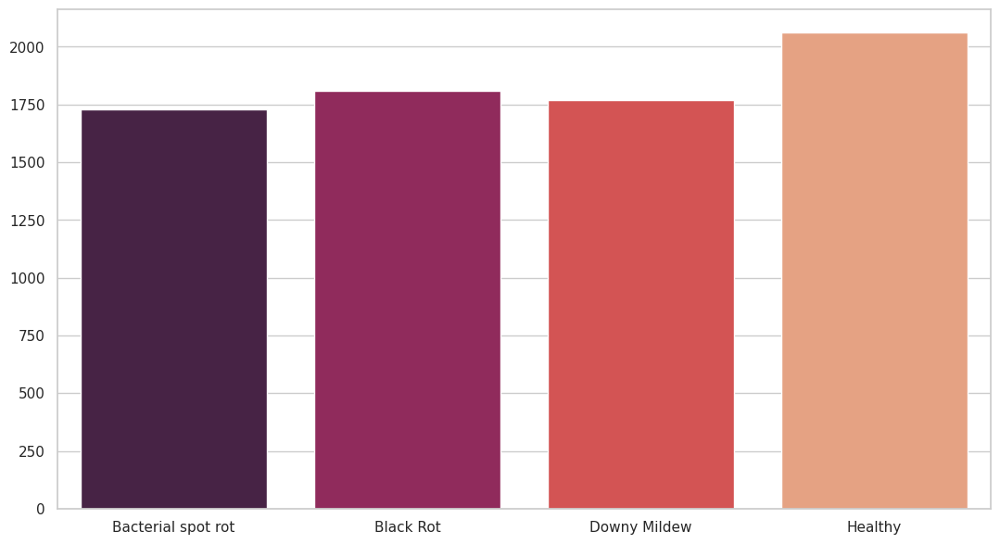

In [6]:
sns.set_theme(style="whitegrid")
Data_imbalance = []
for folder in os.listdir(directory):
    files = gb.glob(pathname=str(directory + "/" + folder +"/*.*"))
    Data_imbalance.append(len(files))
plt.figure(figsize=(13,7))
sns.barplot(x=['Bacterial spot rot', 'Black Rot', 'Downy Mildew', 'Healthy'], y=Data_imbalance, palette="rocket")
plt.show()

In [7]:
total = 0
for i in range(0,len(Data_imbalance)) :
    total +=Data_imbalance[i]

weight_for_0 = (1 / Data_imbalance[0]) * (total / 4.0)
weight_for_1 = (1 / Data_imbalance[1]) * (total / 4.0)
weight_for_2 = (1 / Data_imbalance[2]) * (total / 4.0)
weight_for_3 = (1 / Data_imbalance[3]) * (total / 4.0)

class_weight = {0: weight_for_0, 1: weight_for_1, 2: weight_for_2, 3: weight_for_3}

print('Weight for class 0: {:.2f}'.format(weight_for_0))
print('Weight for class 1: {:.2f}'.format(weight_for_1))
print('Weight for class 2: {:.2f}'.format(weight_for_2))
print('Weight for class 3: {:.2f}'.format(weight_for_3))

Weight for class 0: 1.07
Weight for class 1: 1.02
Weight for class 2: 1.04
Weight for class 3: 0.89


In [8]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip("horizontal"),
  tf.keras.layers.RandomRotation(0.2),
  tf.keras.layers.RandomZoom(0.2),
  tf.keras.layers.RandomHeight(0.2),
  tf.keras.layers.RandomWidth(0.2),
])

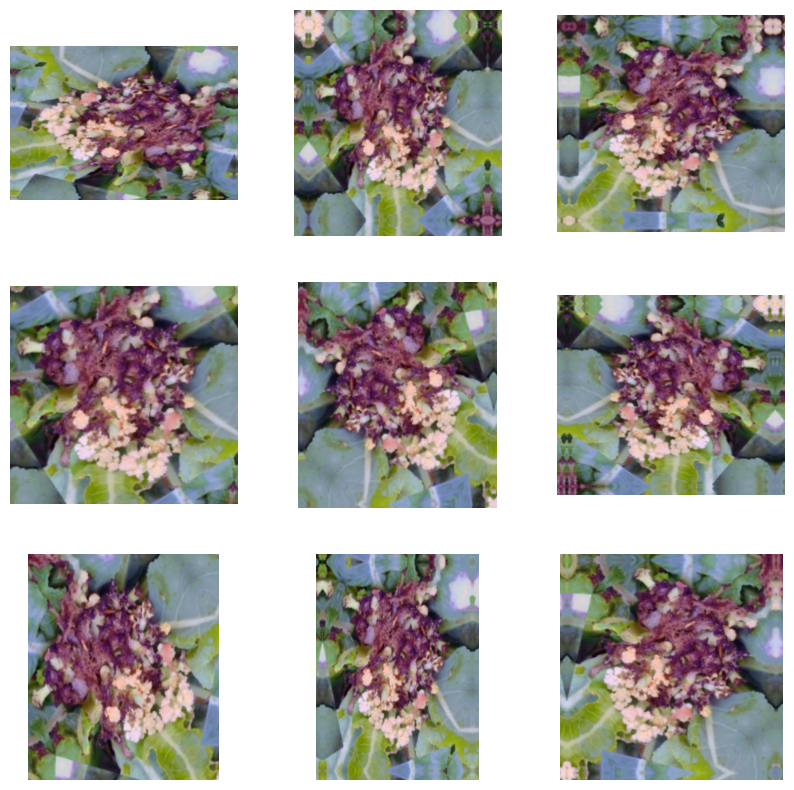

In [9]:
for image, _ in train_dataset.take(1):
    plt.figure(figsize=(10, 10))
    first_image = image[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0))
        plt.imshow(augmented_image[0] / 255)
        plt.axis('off')

**Brown RUST**

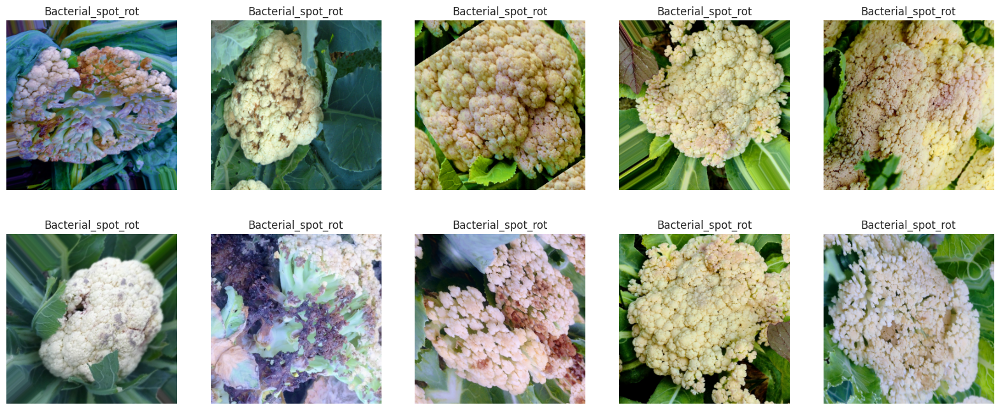

In [10]:
plt.figure(figsize=(20,8))
Bacterial_spot_rot = []
Black_Rot= []
Downy_Mildew =[]


for images , labels in train_dataset.take(1):
    for i in range(100):
        if class_names[labels[i]] == "Bacterial spot rot":
            Bacterial_spot_rot.append(images[i].numpy().astype("uint8"))
        if  class_names[labels[i]] == "Black Rot":
            Black_Rot.append(images[i].numpy().astype("uint8"))
        if  class_names[labels[i]] == "Downy Mildew":
           Downy_Mildew.append(images[i].numpy().astype("uint8"))

for i in range(10):
    plt.subplot(2,5,i+1)
    plt.imshow(Bacterial_spot_rot[i])
    plt.axis("off")
    plt.title("Bacterial_spot_rot")

**BLACK ROT**

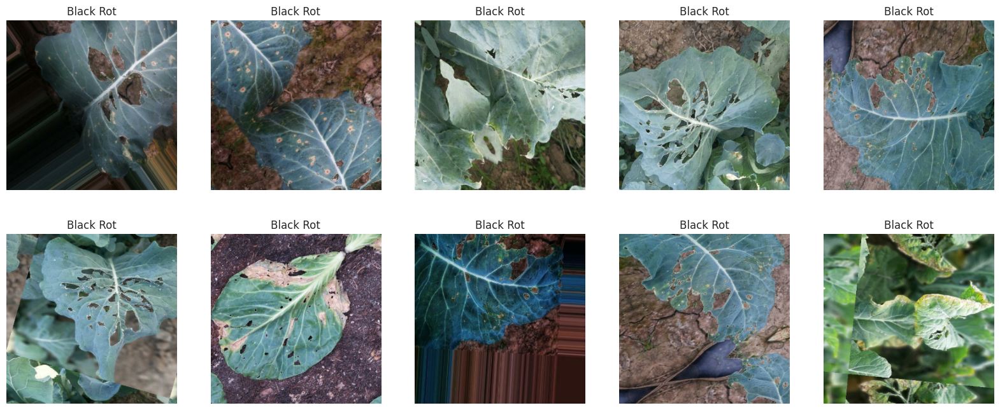

In [11]:
plt.figure(figsize=(20,8))
for i in range(min(10, len(Black_Rot))): # Changed to display up to 10 or the available images
    plt.subplot(2,5,i+1)
    plt.imshow(Black_Rot[i])
    plt.axis("off")
    plt.title("Black Rot")

**Downy_Mildew**

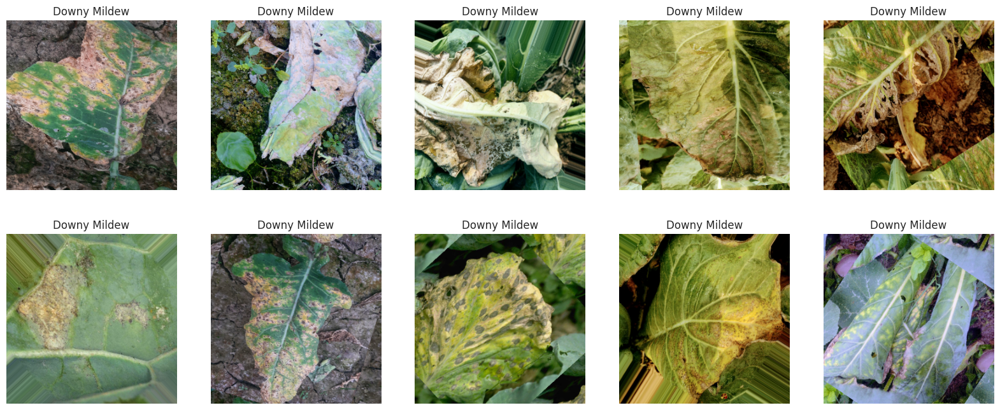

In [12]:
plt.figure(figsize=(20,8))
for i in range(10):
    plt.subplot(2,5,i+1)
    plt.imshow(Downy_Mildew[i])
    plt.axis("off")
    plt.title("Downy Mildew")


In [13]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)

**MODELING**

In [14]:
IMG_SHAPE = IMG_SIZE +(3,)
base_model = tf.keras.applications.InceptionV3(input_shape=IMG_SHAPE, include_top= False,weights='imagenet')

87910968/87910968 [==============================] - 0s 0us/step


In [15]:
type(base_model)
preprocess_input = tf.keras.applications.inception_v3.preprocess_input

In [16]:
nb_layers = len(base_model.layers)
print("Numbers of Layers =" , nb_layers)
print(base_model.layers[nb_layers - 2].name)  # pre- Last name
print(base_model.layers[nb_layers - 1].name)

Numbers of Layers = 311
activation_93
mixed10


In [17]:
# iterate over first batch (32 image) in trainset
image_batch, label_batch = next(iter(train_dataset))  # 32 image arrays
feature_batch = base_model(image_batch)  # run the model on those 32 image (base model with its 1000 causes classification)
print(feature_batch.shape)  # 32 for number of images in this batch and 1000 for classes

(128, 8, 8, 2048)


**Inception v3 (2015)**

In [18]:
def plant_leaf_model( image_shape=IMG_SIZE):
    ''' Define a tf.keras model for multi-class classification out of the InceptionV3 model '''
    image_shape = image_shape + (3,)

    resnet_model = tf.keras.applications.InceptionV3(input_shape=IMG_SHAPE, include_top= False,weights='imagenet')
    resnet_model.trainable = True
    for layer in resnet_model.layers[0 : 291]:
        layer.trainable = False

    inputs = tf.keras.Input(image_shape)
    x = data_augmentation(inputs)
    x = preprocess_input(inputs)
    x = resnet_model(x , training=False)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dropout(0.2)(x)
    prediction_layer = tf.keras.layers.Dense(4 ,activation = "softmax")
    outputs = prediction_layer(x)
    model = tf.keras.Model(inputs, outputs)
    model.summary()
    return model

In [19]:
Plant_Leaf_Model = plant_leaf_model(IMG_SIZE)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 299, 299, 3)]     0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 299, 299, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 299, 299, 3)      0         
 a)                                                              
                                                                 
 inception_v3 (Functional)   (None, 8, 8, 2048)        21802784  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                             

In [20]:
base_learning_rate = 0.1
Plant_Leaf_Model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=base_learning_rate),
                           loss=tf.keras.losses.SparseCategoricalCrossentropy(),
                           metrics=['accuracy'])

In [21]:
history = Plant_Leaf_Model.fit(train_dataset , verbose=2 , epochs=10 ,class_weight=class_weight,
                               validation_data=validation_dataset , use_multiprocessing= True)

Epoch 1/10
52/52 - 2045s - loss: 39.6346 - accuracy: 0.8795 - val_loss: 0.0292 - val_accuracy: 0.9864 - 2045s/epoch - 39s/step
Epoch 2/10
52/52 - 1847s - loss: 0.0620 - accuracy: 0.9801 - val_loss: 0.0164 - val_accuracy: 0.9932 - 1847s/epoch - 36s/step
Epoch 3/10
52/52 - 1853s - loss: 0.0270 - accuracy: 0.9917 - val_loss: 0.0172 - val_accuracy: 0.9946 - 1853s/epoch - 36s/step
Epoch 4/10
52/52 - 1837s - loss: 0.0194 - accuracy: 0.9938 - val_loss: 0.0084 - val_accuracy: 0.9986 - 1837s/epoch - 35s/step
Epoch 5/10
52/52 - 1832s - loss: 0.0195 - accuracy: 0.9935 - val_loss: 0.0113 - val_accuracy: 0.9932 - 1832s/epoch - 35s/step
Epoch 6/10
52/52 - 1808s - loss: 0.0184 - accuracy: 0.9934 - val_loss: 0.0016 - val_accuracy: 1.0000 - 1808s/epoch - 35s/step
Epoch 7/10
52/52 - 1801s - loss: 0.0127 - accuracy: 0.9958 - val_loss: 0.0119 - val_accuracy: 0.9986 - 1801s/epoch - 35s/step
Epoch 8/10
52/52 - 1807s - loss: 0.0121 - accuracy: 0.9965 - val_loss: 0.0048 - val_accuracy: 0.9986 - 1807s/epoch - 

In [22]:
Plant_Leaf_Model.evaluate(validation_dataset , verbose = 1)

6/6 [==============================] - 173s 27s/step - loss: 0.0013 - accuracy: 1.0000


[0.0013222782872617245, 1.0]

1/1 [==============================] - 0s 222ms/step


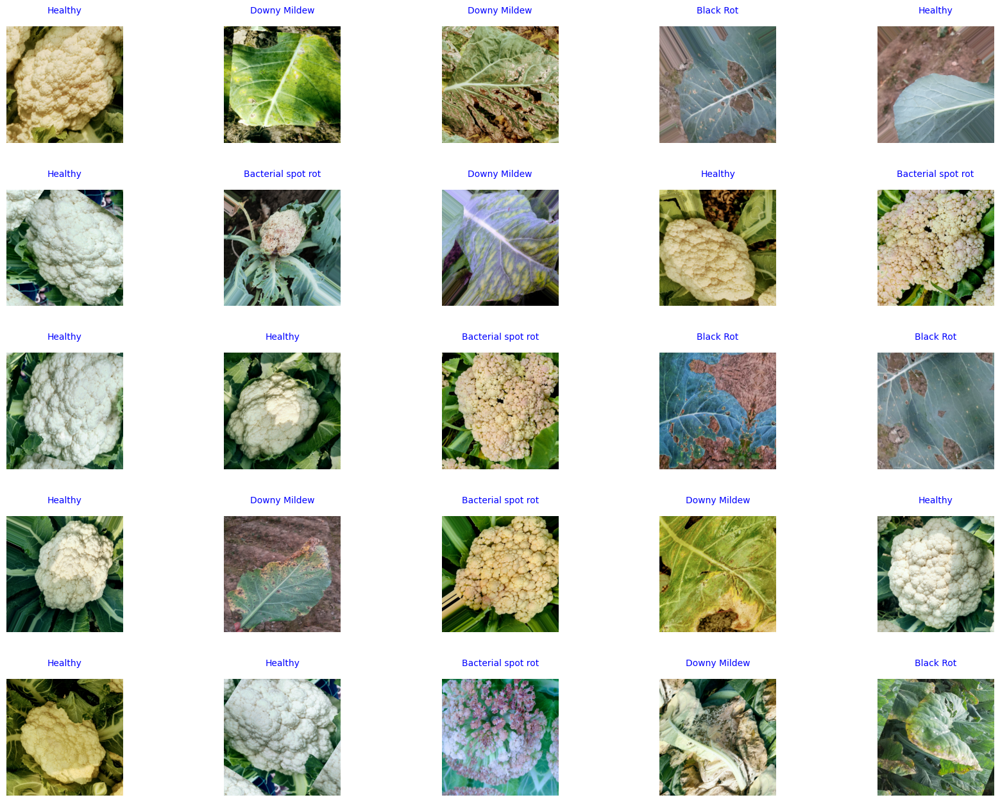

In [23]:
plt.figure(figsize=(20, 15))
for images, labels in train_dataset.take(1):
    for i in range(25):
        plt.subplot(5,5,i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.axis("off")
        im2 = images[i].numpy().astype("uint8")
        img2 = tf.expand_dims(im2, 0)
        predict = Plant_Leaf_Model.predict(img2)
        predicted= class_names[np.argmax(predict)]
        actual = class_names [labels[i].numpy().astype("uint8")]
        if (actual == predicted):
            plt.title(predicted, fontsize=10, color= 'blue', pad=15);
        else :
            plt.title(actual, fontsize=10, color= 'red' ,pad=15);
        plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9,
                            top=0.9, wspace=0.4,hspace=0.4)

**Plotting Accuracy**

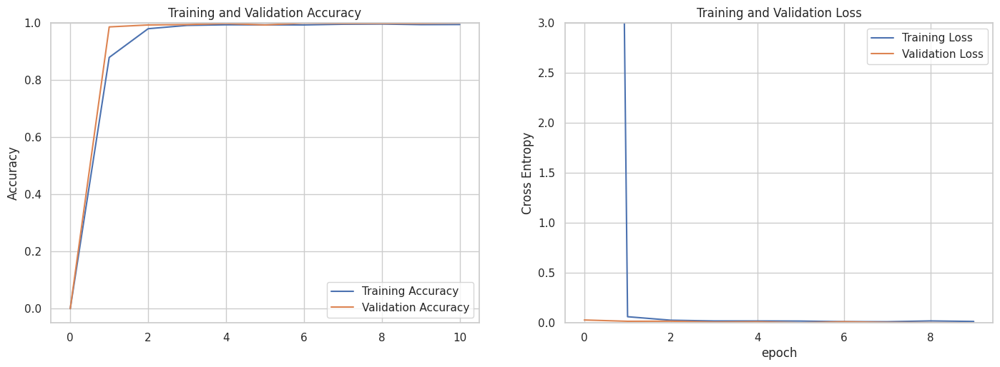

In [24]:
acc = [0.] + history.history['accuracy']
val_acc = [0.] + history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(17, 12))
plt.subplot(2, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,3.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

4/4 [==============================] - 23s 5s/step


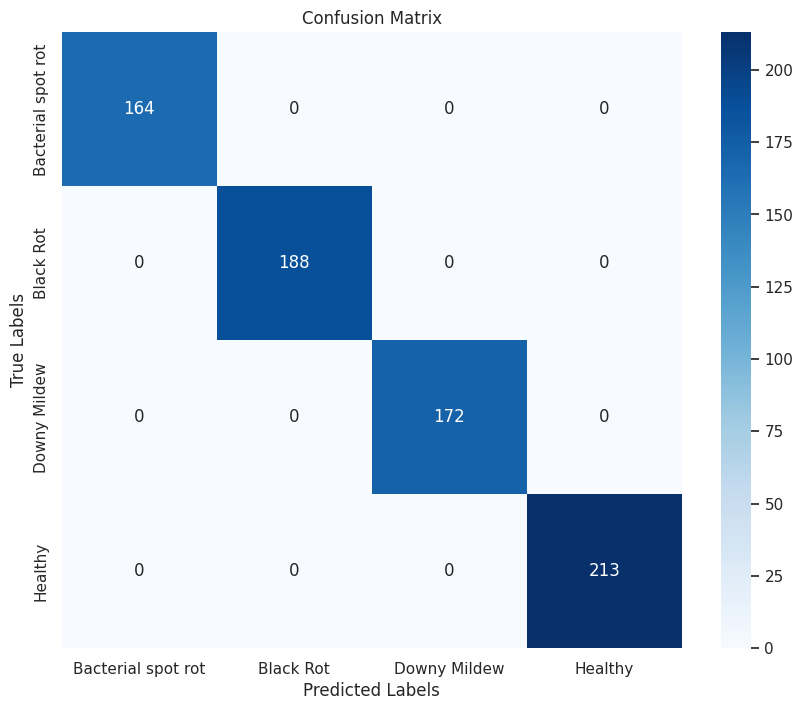

Confusion Matrix:
[[164   0   0   0]
 [  0 188   0   0]
 [  0   0 172   0]
 [  0   0   0 213]]


In [25]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Get the true labels and predicted labels
true_labels = []
predicted_labels = []

for images, labels in validation_dataset:
    predictions = Plant_Leaf_Model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)
    true_labels.extend(labels.numpy())
    predicted_labels.extend(predicted_classes)

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

# Print confusion matrix separately
print("Confusion Matrix:")
print(conf_matrix)




In [26]:
# Print classification report separately
print("Classification Report:")
report = classification_report(true_labels, predicted_labels, target_names=class_names)
print(report)

Classification Report:
                    precision    recall  f1-score   support

Bacterial spot rot       1.00      1.00      1.00       164
         Black Rot       1.00      1.00      1.00       188
      Downy Mildew       1.00      1.00      1.00       172
           Healthy       1.00      1.00      1.00       213

          accuracy                           1.00       737
         macro avg       1.00      1.00      1.00       737
      weighted avg       1.00      1.00      1.00       737

